# **SmartSeq**

## HCC1806

For this part of the study we will simply report the plots obtained when it comes to study the HCC1086 cells. The sequencing techniques is the same of the plots above and also the sample size is comparable. Therefore, the differences that will be pointed out in this section will be related just to the cell type

##Exploratory data analysis and Data cleaning


We start by loading the necessary libraries and load the first two datasets from our drive. Please notice that you'll need to change it, in order to match it with the path to the file on your local machine.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import random

In [ ]:
unfilt = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_SmartS_Unfiltered_Data.txt', delimiter = " ", index_col = 0)
meta = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_SmartS_MetaData.tsv', delimiter = "\t", index_col = 0)

We now see how the data is stored in these tables, looking at the first entries:
We notice that with respect to MCF7 Cells there's just a slightly difference in how the cells are named


In [ ]:
meta

,Cell Line,PCR Plate,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,HCC1806,1,A10,Normo,24,S123,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,HCC1806,1,A12,Normo,24,S26,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,HCC1806,1,A1,Hypo,24,S97,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,HCC1806,1,A2,Hypo,24,S104,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,HCC1806,1,A3,Hypo,24,S4,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
...,...,...,...,...,...,...,...,...
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,HCC1806,4,H10,Normo,24,S210,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,HCC1806,4,H11,Normo,24,S214,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,HCC1806,4,H2,Hypo,24,S199,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


The second is the actual table containig the read counts as described above

In [ ]:
print("The dimension of this dataset is:", unfilt.shape,"\n")
unfilt

The dimension of this dataset is: (23396, 243) 



,output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
WASH7P,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CICP27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DDX11L17,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
OR4F29,2,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,22,43,0,0,0,3,47,4,2,8,...,24,15,15,4,4,26,1,4,4,20
MT-CYB,4208,6491,25,4819,310,695,2885,1552,366,1829,...,1119,1429,808,999,916,3719,984,2256,981,2039
MT-TT,26,62,0,11,4,0,41,9,2,8,...,48,31,3,8,5,42,1,15,6,34
MT-TP,66,71,1,3,9,14,91,22,3,30,...,119,52,11,22,15,48,18,36,8,79


We can first check if the data type is always the same across the features in the dataframe

In [ ]:
assert [unfilt.T.dtypes[i] == 'int64' for i in range(len(unfilt.dtypes))]
#And this is the case

print("The number of missing values in this dataset is:", unfilt.isnull().sum(axis = 1).sum(axis = 0), "\n")
#Luckly enough there are not :)

dup_rows_unfilt = unfilt[unfilt.duplicated(keep=False)]
print("The number of duplicate rows is", dup_rows_unfilt.shape[0], "\n")

dup_rows_corr = dup_rows_unfilt.T.corr()

dup_dict = {}

for col in dup_rows_corr.columns:
  for row in dup_rows_corr.index:
    if (dup_rows_corr.loc[row, col] == 1 and row != col):
      if row not in dup_dict:
        dup_dict[row] = []
      dup_dict[row].append(col)

dup_dict

The number of missing values in this dataset is: 0 

The number of duplicate rows is 89 



{'ALPK2': ['C4orf45'],
 'AOX3P': ['RNY1P12'],
 'APLNR': ['LINC01361',
  'ITGA10',
  'GPA33',
  'C4orf50',
  'SMIM23',
  'VNN3',
  'TRPV6',
  'KCNA4',
  'CYCSP26',
  'OR5AU1',
  'CD300A',
  'DTNA',
  'PLVAP'],
 'ASS1P4': ['RPL10AP3'],
 'B3GAT1-DT': ['CPS1', 'COL2A1'],
 'C4orf45': ['ALPK2'],
 'C4orf50': ['LINC01361',
  'ITGA10',
  'GPA33',
  'SMIM23',
  'VNN3',
  'TRPV6',
  'KCNA4',
  'APLNR',
  'CYCSP26',
  'OR5AU1',
  'CD300A',
  'DTNA',
  'PLVAP'],
 'CCL3L1': ['CCL3L3'],
 'CCL3L3': ['CCL3L1'],
 'CCR4': ['KCNJ16'],
 'CD300A': ['LINC01361',
  'ITGA10',
  'GPA33',
  'C4orf50',
  'SMIM23',
  'VNN3',
  'TRPV6',
  'KCNA4',
  'APLNR',
  'CYCSP26',
  'OR5AU1',
  'DTNA',
  'PLVAP'],
 'CILP': ['RPL21P88'],
 'CNPY1': ['LINC01647'],
 'COL2A1': ['CPS1', 'B3GAT1-DT'],
 'CPS1': ['B3GAT1-DT', 'COL2A1'],
 'CUX2': ['LINC01247'],
 'CYCSP26': ['LINC01361',
  'ITGA10',
  'GPA33',
  'C4orf50',
  'SMIM23',
  'VNN3',
  'TRPV6',
  'KCNA4',
  'APLNR',
  'OR5AU1',
  'CD300A',
  'DTNA',
  'PLVAP'],
 'DTNA': ['LI

In [ ]:
#Here we drop the diplicate genes that we recorded
unfilt = unfilt.copy().drop_duplicates()

---
Now we turn our attention to the study of the correlation between cells. The result here is an average correlation that is a bit less the one obtained for the MCF7 data.

Average correlation between cells:  0.49929107365519126
Minimum correlation between cells:  -0.0014178526896174333 



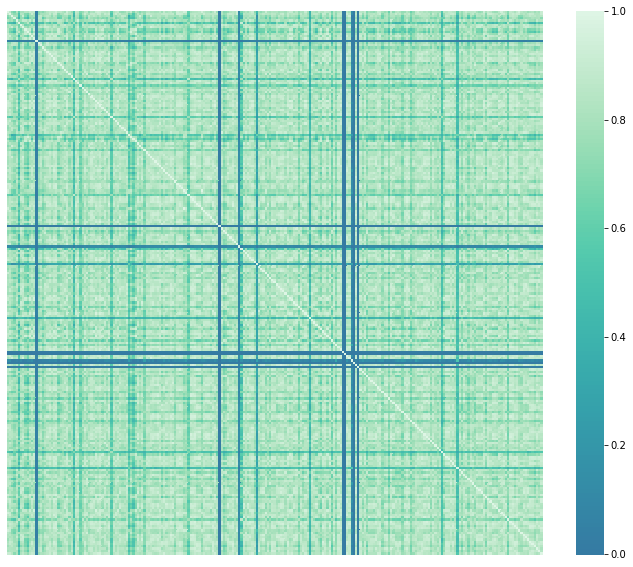

In [ ]:
plt.figure(figsize=(12,10))

corr = unfilt.corr()
midpoint = (corr.values.max() - corr.values.min()) /2 + corr.values.min()

sns.heatmap(corr,cmap="mako", center=0, yticklabels=False , xticklabels=False)

print("Average correlation between cells: ", midpoint)
print("Minimum correlation between cells: ", corr.values.min(), "\n")

Again, we can see from the minimum value obtained that there are some cells that are completely uncorrelated from the others and we want to see why:

Text(0, 0.5, 'Frequency')

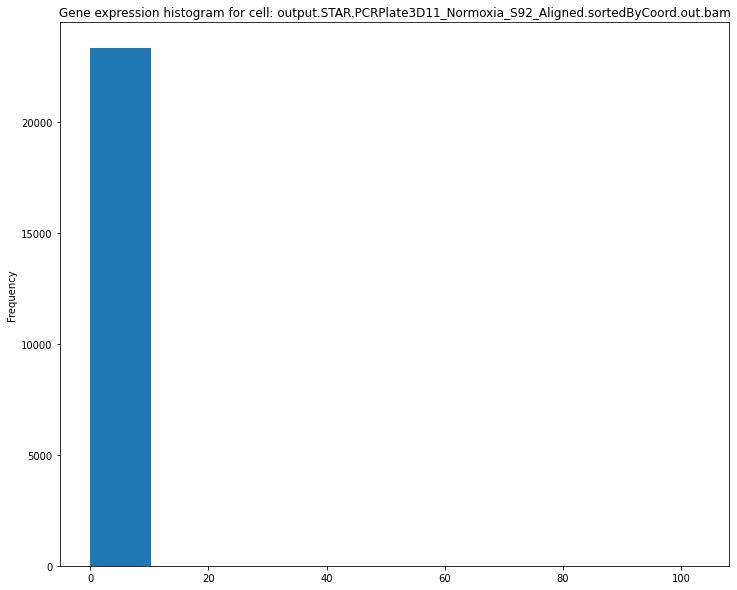

In [ ]:
plt.figure(figsize=(12,10))
#Given the symmetry of the table i look for low correlated cells in the first column, but
#that's completely arbirary
min  = np.argmin(list(corr[corr.columns.values[1]]))
plt.hist(unfilt.iloc[:,min])
plt.title(f"Gene expression histogram for cell: {unfilt.columns.values[min]}")
plt.ylabel("Frequency")

Here we can see the same result. These cells have zero count for every gene. These cells are abnormal and therefore will need to be removed.

We now want to analyse the structure among the covariates. Notice that here due to computational power issues we display the correlation just of the first 10% of the genes.

Average correlation between cells:  0.40951765039846083
Minimum correlation between cells:  -0.1809646992030784 



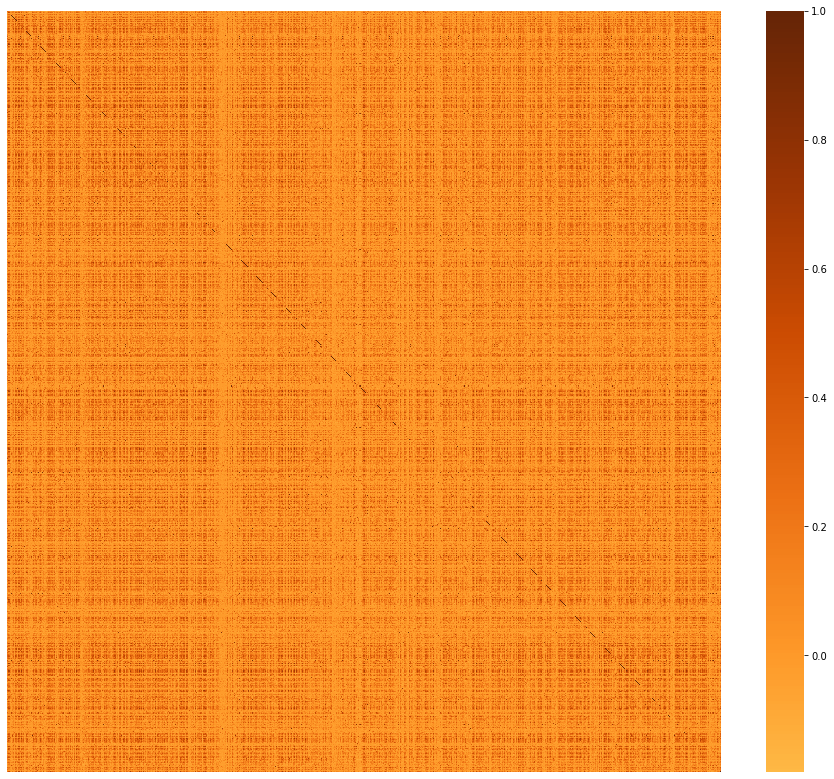

In [ ]:
plt.figure(figsize=(16,14))
#df_small = df.iloc[:, :50]
#c= df_small.corr()
corr = unfilt.iloc[:3000,:].T.corr()
midpoint = (corr.values.max() - corr.values.min()) /2 + corr.values.min()
#sns.heatmap(c,cmap='coolwarm',annot=True, center=midpoint )
sns.heatmap(corr,cmap="YlOrBr", center=0, yticklabels=False , xticklabels=False)

print("Average correlation between cells: ", midpoint)
print("Minimum correlation between cells: ", corr.values.min(), "\n")

Even if we are dealing with just the 10% of the data we can clearly see how there's not a well defined structure among the genes. This can be paroblem if we consider the dimension of the dataset, some more structure for sure would have helped us in dimensionality reduction, for example, or in the task to find the so called "meta-genes". This average correlation is even less the one obtained for MCF7


---

Given what we've seen in the table `unfilt` we suspect that our dataset will be probably very sparsed, so we want to quantify that sparsity in some way. The first and more intutive one is to calculate the average sparsity and to plot the table in some way.

This average sparsity is almost 5% less than the one obtained in MCF7



In [ ]:
#Avarage density of zeros in the data

print(f"The average sparsity of the table is: {(unfilt == 0).sum().sum() / (unfilt.shape[0] * unfilt.shape[1]) * 100}%")

The average sparsity of the table is: 55.76545995438026%


Again, our dataset is definitely sparsed.

In the following plot we color with blue the points in the table that are different from zero. This can give us an idea of how this high sparsity is distributed across the dataset

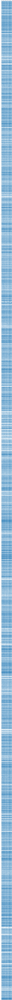

In [ ]:
plt.figure(figsize=(25, 600))
plt.spy(unfilt.iloc[:, :], markersize=1)

For the discussion of this plot see the one made for the SmarSeq MCF7 dataset, because it's analogus.

We describe the data to see some statistics of the distributions over the cells

In [ ]:
unfilt.describe()

,output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
count,23342.000000,23342.000000,23342.000000,23342.000000,23342.000000,23342.000000,23342.000000,23342.000000,23342.000000,23342.000000,...,23342.000000,23342.000000,23342.000000,23342.000000,23342.000000,23342.000000,23342.000000,23342.000000,23342.000000,23342.000000
mean,99.795947,208.126896,9.716391,151.004027,35.779496,47.197284,153.152643,136.182589,38.452660,45.617171,...,76.534359,105.796718,54.145146,29.829406,28.967484,104.975538,35.262874,108.445849,37.361109,76.472753
std,530.122968,982.196276,65.620267,978.042324,206.116742,545.993502,865.942966,871.712002,265.362499,367.122155,...,347.041462,537.480379,344.457045,186.932074,135.624956,445.260258,171.061263,589.740715,181.600602,369.500033
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,1.000000
75%,52.000000,126.000000,5.000000,40.000000,22.000000,17.000000,82.000000,76.000000,22.000000,18.000000,...,57.000000,67.000000,30.000000,18.000000,19.000000,76.000000,24.000000,68.000000,23.000000,45.000000
max,35477.000000,69068.000000,6351.000000,70206.000000,17326.000000,47442.000000,43081.000000,62813.000000,30240.000000,35450.000000,...,19629.000000,30987.000000,21894.000000,13457.000000,11488.000000,33462.000000,15403.000000,34478.000000,10921.000000,28532.000000


Text(0, 0.5, 'Frequency')

<Figure size 1440x1224 with 0 Axes>

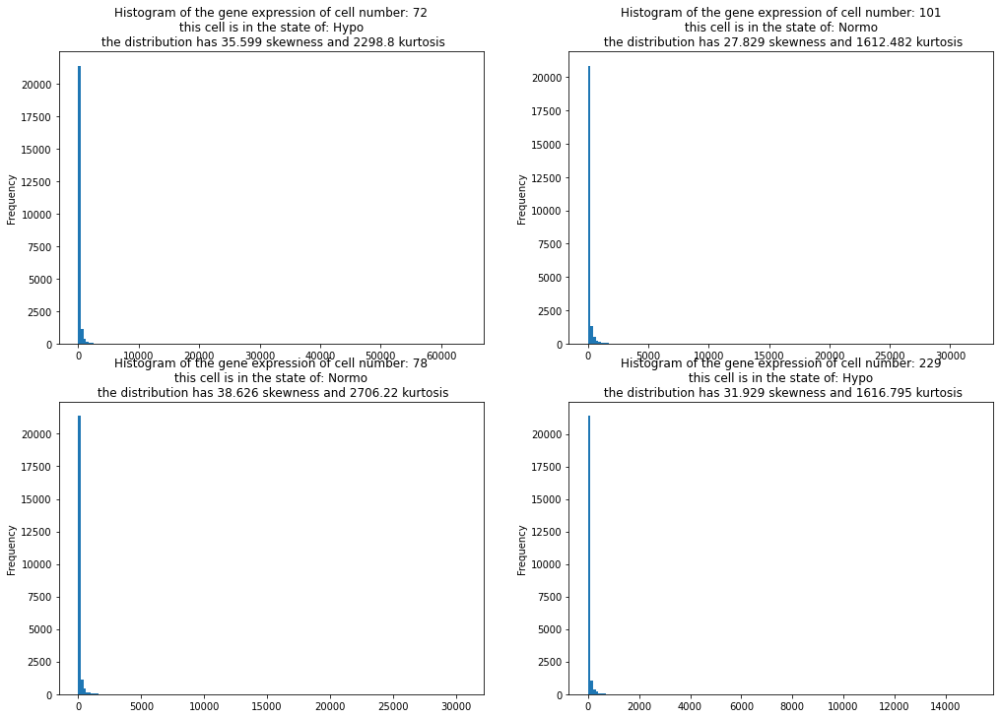

In [ ]:
from scipy.stats import kurtosis, skew

plt.figure(figsize=(20, 17))

first_cell = random.randrange(unfilt.shape[1])
second_cell = random.randrange(unfilt.shape[1])
third_cell = random.randrange(unfilt.shape[1])
fourth_cell = random.randrange(unfilt.shape[1])

plt.figure(figsize=(17, 12))

plt.subplot(2, 2, 1)
plt.hist(unfilt.iloc[:,first_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {first_cell}\n this cell is in the state of: {meta.iloc[first_cell, 3]} \n the distribution has {round(skew(unfilt.iloc[:,first_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,first_cell]), 3)} kurtosis")
plt.ylabel("Frequency")

plt.subplot(2, 2, 2)
plt.hist(unfilt.iloc[:,second_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {second_cell}\n this cell is in the state of: {meta.iloc[second_cell, 3]} \n the distribution has {round(skew(unfilt.iloc[:,second_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,second_cell]), 3)} kurtosis")
plt.ylabel("Frequency")

plt.subplot(2, 2, 3)
plt.hist(unfilt.iloc[:,third_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {third_cell}\n this cell is in the state of: {meta.iloc[third_cell, 3]} \n the distribution has {round(skew(unfilt.iloc[:,third_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,third_cell]), 3)} kurtosis")
plt.ylabel("Frequency")

plt.subplot(2, 2, 4)
plt.hist(unfilt.iloc[:,fourth_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {fourth_cell}\n this cell is in the state of: {meta.iloc[fourth_cell, 3]} \n the distribution has {round(skew(unfilt.iloc[:,fourth_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,fourth_cell]), 3)} kurtosis")
plt.ylabel("Frequency")



The distribution of gene counts for each cell is the sane as above, the discussion is analogus

---

We now study the distribution of counts for a single gene among the different cells in the sample

Text(0, 0.5, 'Frequency (possibly scaled)')

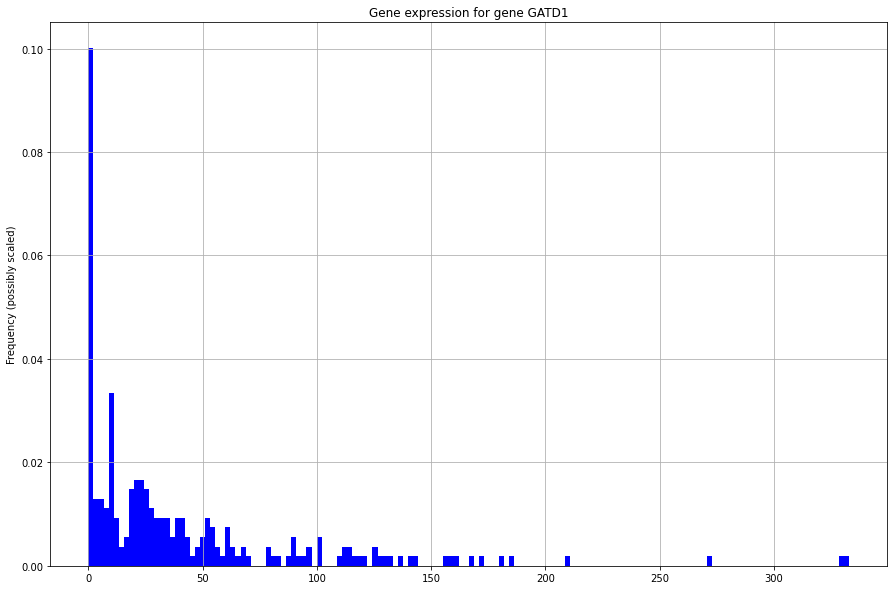

In [ ]:
rdn_gene = random.randrange(unfilt.shape[0])

plt.figure(figsize=(15, 10))
unfilt.iloc[rdn_gene, :].plot.hist(grid=True,
                                      density = True,
                                      bins=150,
                                      color='blue')

plt.title(f"Gene expression for gene {unfilt.index[rdn_gene]}")
plt.ylabel("Frequency (possibly scaled)")

The important characteristics we want to point out are the same:
- A low number of counts associated with a large proportion of genes
- A long right tail due to the lack of any upper limit for expression
- A large dynamic range

The distribution seems again to follow a Poisson/Negative binomial distribution.

And we remind why is it the case:
**With RNA-Seq data, a very large number of RNAs are represented and the probability of pulling out a particular transcript is very small**

---
Given what stated above, we further investigate the ralation between mean and variance of the gene expression among cells to see if we would prefer adopting a Negative Binomial ditribution:

Text(0, 0.5, 'Variance')

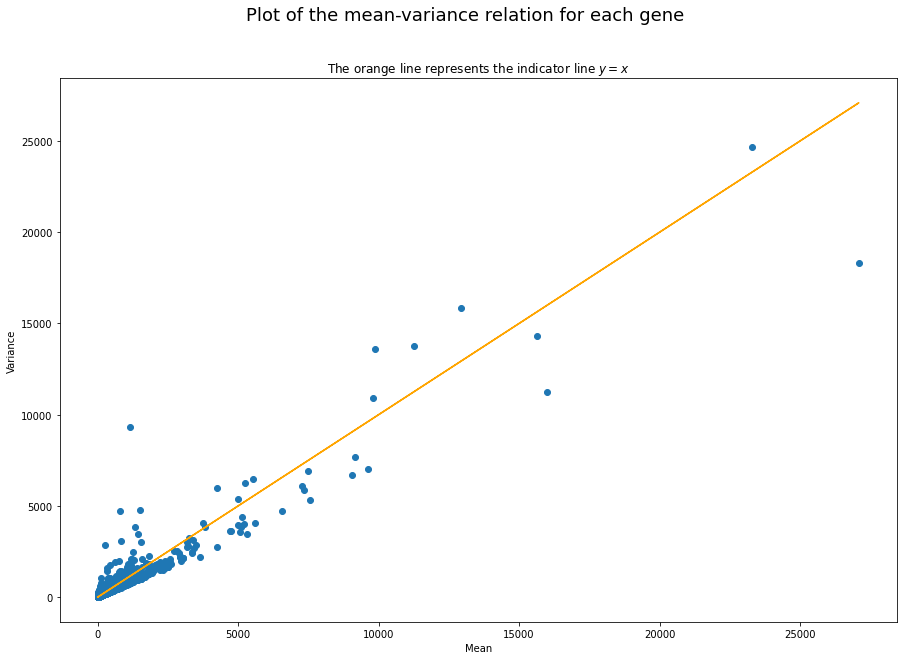

In [ ]:
##################### THIS PLOT COULD TAKE SOME TIME ########################
mean_vector = unfilt.T.describe().iloc[1,:]
var_vector = unfilt.T.describe().iloc[2,:]

plt.figure(figsize=(15, 10))
plt.scatter(mean_vector, var_vector)
plt.plot(mean_vector, mean_vector, color = "orange")
plt.title("The orange line represents the indicator line $y=x$", fontsize = 12)
plt.suptitle("Plot of the mean-variance relation for each gene", fontsize = 18)
plt.xlabel("Mean")
plt.ylabel("Variance")



Also here we see that there's a sort of linear 1:1 relation between mean and variance, we can try to use the Poisson distribution to model the gene expression and use it to identify **HVG** (Highly Variable Genes). Those will be the genes we want to keep when filtering (See the next part)

##Filtering and Normalization

###Cells filtering

We now check if the total reads among cells follow a normal distribution, meaning that the difference in total read counts it's just a measurement error.

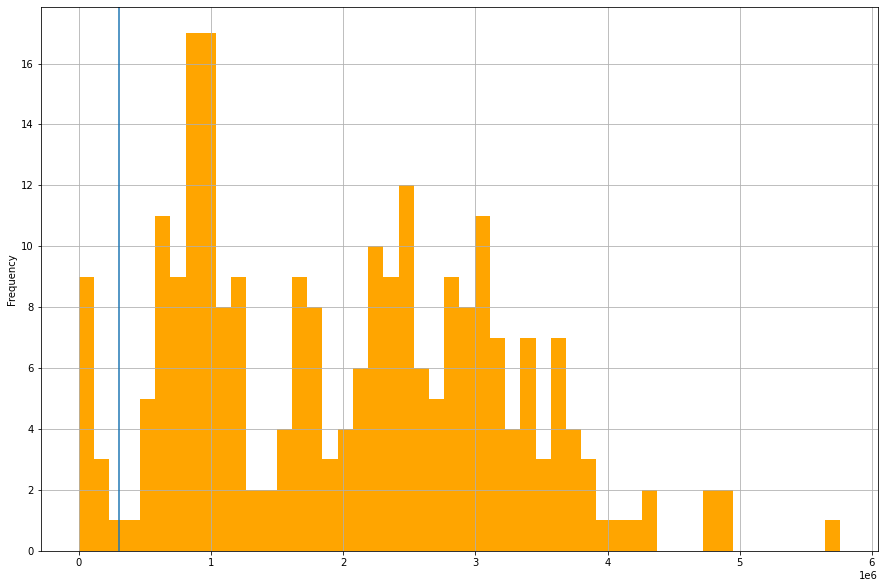

In [ ]:
totsums = unfilt.sum(axis = 0)

plt.figure(figsize=(15, 10))
plt.axvline(x=0.30e6) #Where do we want to do the cut in our filtering
totsums.plot.hist(grid = True, bins = 50, color= "orange")

Now we want to plot an istogram of the number of genes different from zero for each cell, also this should follow a normal distribution (this is a stadard step in each analysis)

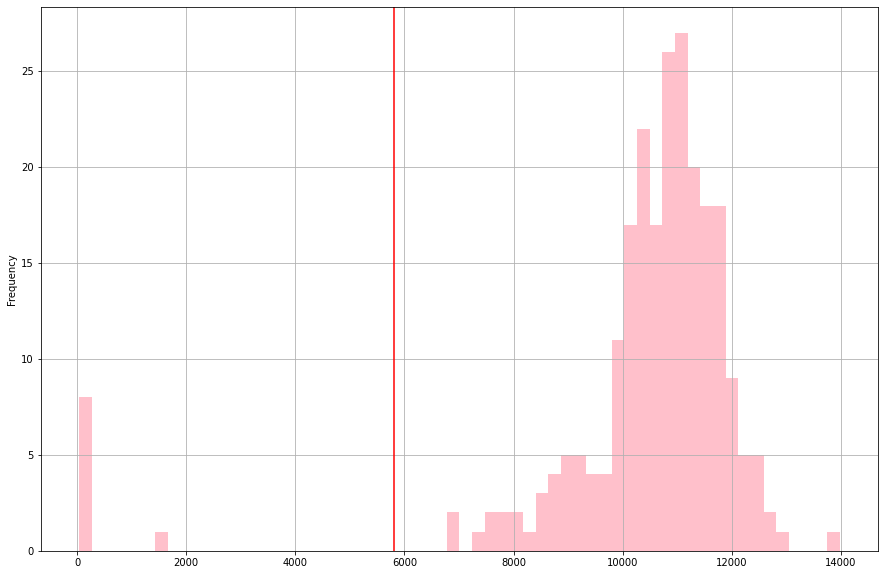

In [ ]:
#Create a copy dataframe where all the positive entries will become equal to one
copy = unfilt.copy()
copy[copy != 0] = 1
totcopysums = copy.sum(axis = 0)

plt.figure(figsize=(15, 10))
plt.axvline(x=5800, color = "red") #Where do we want to do the cut in our filtering
totcopysums.plot.hist(grid = True, bins = 60, color= "pink")

This last plot is even nicer that the one of MCF7! Also these plots are suggesting that indeed there's a measuement error following a normal distribution and therefore we would like to cut those cells that do not follow this curve, because their gene expression may be corrupted by human mistakes in extracting the data or by the health status of the cell itself.

Again, the blue vertical line in the first plot and the red one in the second indicate where (by eye) the plot finishes to be a nice bell-shaped histogram and thus where we want to cut in the filtering.


---

Here we proceed with the above described filtering

In [ ]:
filtered  = unfilt.loc[:, (totsums >= .30e6) & (copy.sum(axis = 0) >= 5800)]
perc_cell_lost = (unfilt.shape[1] - filtered.shape[1]) / unfilt.shape[1] * 100
print(f" We passed from haveing {unfilt.shape[1]} cells to have {filtered.shape[1]} cells\n This results in a lost of the {perc_cell_lost}% of the cells")

 We passed from haveing 243 cells to have 230 cells
 This results in a lost of the 5.349794238683128% of the cells


In [ ]:
filtered

,output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
WASH7P,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CICP27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DDX11L17,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
WASH9P,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,1,0,0
OR4F29,2,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,22,43,0,0,3,47,4,2,8,17,...,24,15,15,4,4,26,1,4,4,20
MT-CYB,4208,6491,4819,310,695,2885,1552,366,1829,3387,...,1119,1429,808,999,916,3719,984,2256,981,2039
MT-TT,26,62,11,4,0,41,9,2,8,9,...,48,31,3,8,5,42,1,15,6,34
MT-TP,66,71,3,9,14,91,22,3,30,37,...,119,52,11,22,15,48,18,36,8,79


We now want to study the percentage of mitochondrial RNA and cut those cells at a rate that is too high (above 4%/5% is the rule of thumb that we adopt here). You can see the discutssion above to see why is important to account for mithocondrial Rna in our filtering

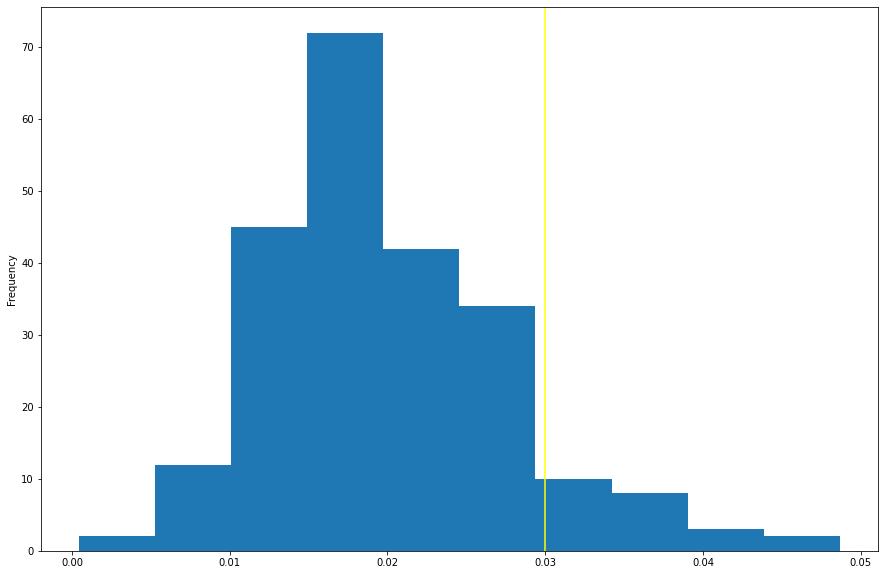

In [ ]:
total_mitocondrial = filtered[filtered.index.str.startswith('MT-')].sum(axis = 0)
total_express = filtered.sum(axis = 0)
assert len(total_mitocondrial) == len(total_express)

mito_ratio = total_mitocondrial / total_express

plt.figure(figsize=(15, 10))
plt.axvline(x=0.03, color = "yellow") #Where do we want to do the cut in our filtering
mito_ratio.plot.hist()

We filter cells with too much mitocondrial RNA

In [ ]:
filtered_cells = filtered.loc[:, mito_ratio <= 0.03]
filtered_cells

,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B11_Normoxia_S127_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B12_Normoxia_S27_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
WASH7P,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
CICP27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DDX11L17,0,0,0,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,1,0,0
OR4F29,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,43,0,0,3,47,4,2,17,17,15,...,24,15,15,4,4,26,1,4,4,20
MT-CYB,6491,4819,310,695,2885,1552,366,3387,7107,2384,...,1119,1429,808,999,916,3719,984,2256,981,2039
MT-TT,62,11,4,0,41,9,2,9,25,9,...,48,31,3,8,5,42,1,15,6,34
MT-TP,71,3,9,14,91,22,3,37,88,53,...,119,52,11,22,15,48,18,36,8,79


And this is the end for us of the filtering of the cells.

---

### Normalization

We first recall what is the distribution of a randomly choosen gene, this time within the cells that passed the filtering section

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Gene expression for gene TRPV1')

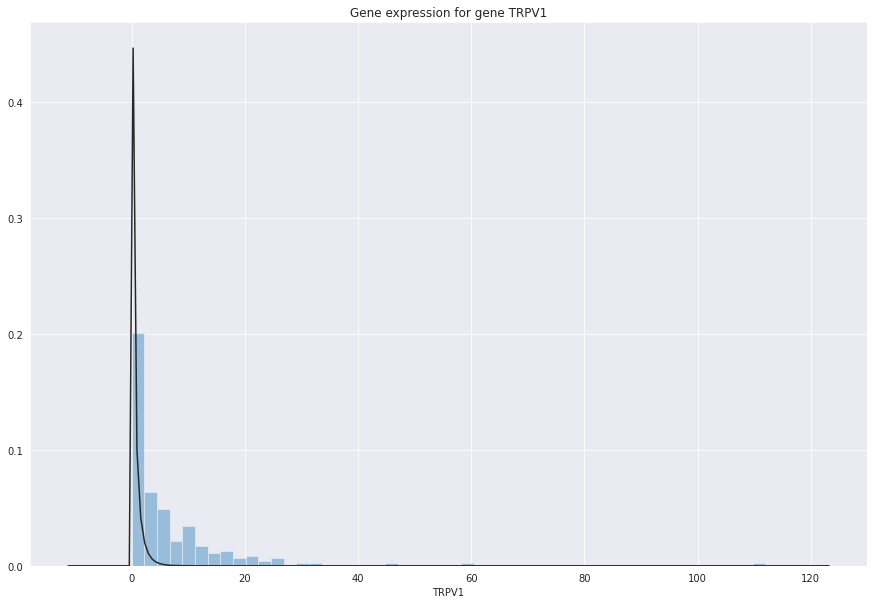

In [ ]:
rdn_gene = random.randrange(filtered_cells.shape[0])
plt.figure(figsize=(15, 10))
sns.set_style('darkgrid')
sns.distplot(filtered_cells.iloc[rdn_gene, :], fit=stats.gamma,
                                          kde=False,
                                          bins = 50)
plt.title(f"Gene expression for gene {unfilt.index[rdn_gene]}")


Here you see an histogram with a gamma distribution fitted.

We now want to check that normalizing for total reads across cells will change the distribution for our single gene. This is a normalization in Cell dimension and reading depth, if we want to perform comparisons within cells we need them to be indeed comparable.

In [ ]:
unfilt_CPM = filtered_cells.copy()

#CPM normalization
for i in range(unfilt_CPM.shape[1]):
  unfilt_CPM.iloc[:,i] = unfilt_CPM.iloc[:,i]/(sum(unfilt_CPM.iloc[:,i])/10e6)


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


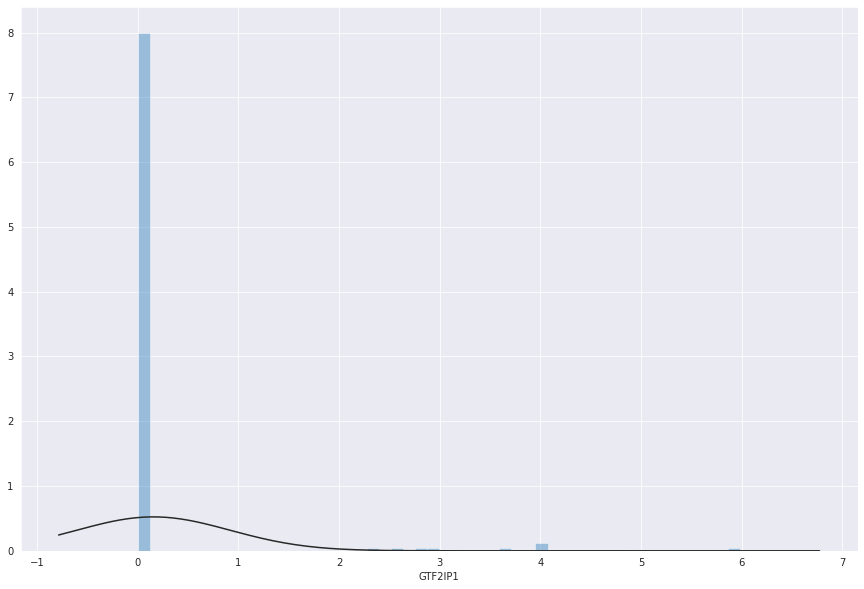

In [ ]:
rdn_gene = random.randrange(filtered_cells.shape[0])

plt.figure(figsize=(15, 10))
sns.set_style('darkgrid')
sns.distplot(unfilt_CPM.iloc[rdn_gene, :], fit=stats.norm,
                                          kde=False,
                                          bins = 50)

Again, I invite the reader to see above the long discussion about the limitations of using just a CPM normalization and not another more advanced normalization factor

In [ ]:
#Log + 1 transfomration
Normal = np.log(unfilt_CPM.copy() + 1)
Normal

,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B11_Normoxia_S127_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B12_Normoxia_S27_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
WASH7P,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.119858,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CICP27,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
DDX11L17,0.000000,0.000000,0.000000,2.310261,0.000000,0.000000,0.000000,1.839774,1.276152,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WASH9P,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.496612,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.625521,0.000000,1.599483,0.000000,0.000000
OR4F29,0.000000,0.000000,0.000000,0.000000,1.334288,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,4.494373,0.000000,0.000000,3.340426,4.886376,2.608853,3.147706,4.511045,3.804617,3.464681,...,4.907816,4.122946,4.784858,4.068143,4.096969,4.673835,2.576354,2.821491,3.847318,4.727769
MT-CYB,9.500185,9.523174,8.219553,8.749820,8.996055,8.493594,8.313537,9.794540,9.817775,8.501586,...,8.742697,8.663470,8.763136,9.571416,9.514002,9.627635,9.388965,9.095296,9.328117,9.343454
MT-TT,4.856878,3.472215,3.889670,0.000000,4.750904,3.378024,3.147706,3.884775,4.183129,2.974496,...,5.597262,4.840488,3.208295,4.752699,4.316783,5.149846,2.576354,4.098620,4.245645,5.254748
MT-TP,4.991437,2.252478,4.689172,4.852645,5.543431,4.251478,3.538750,5.282793,5.430612,4.704238,...,6.502970,5.354548,4.477737,5.758794,5.406460,5.282652,5.392190,4.964361,4.529739,6.094856


We now look at the effect of this normalization on the distribution of a random gene.

N.B: you can run this cell multiple times to see different genes choosen. As you can see it's not difficult to find genes with almost all zero reads (we will take care of this issue soon)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


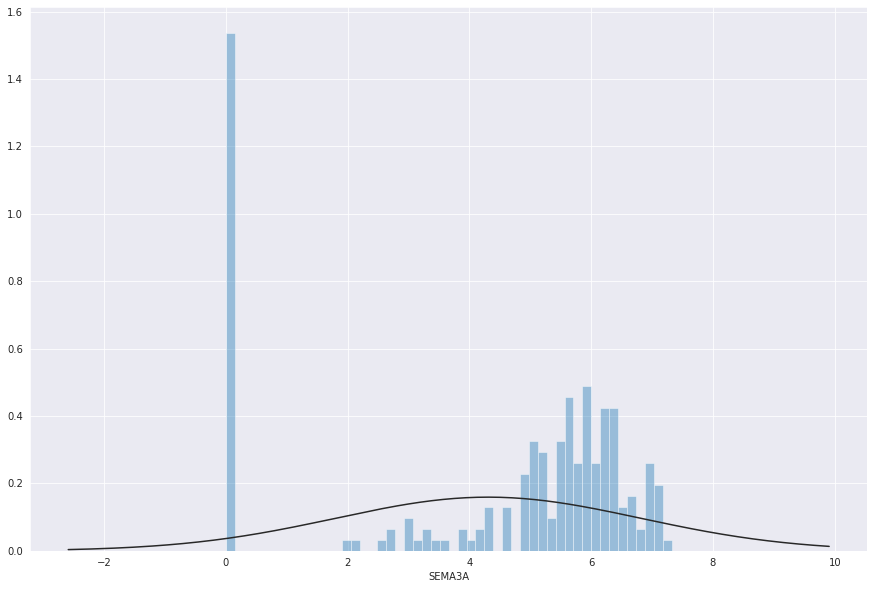

In [ ]:
rdn_gene = random.randrange(filtered_cells.shape[0])

plt.figure(figsize=(15, 10))
sns.set_style('darkgrid')
sns.distplot(Normal.iloc[rdn_gene, :], fit=stats.norm,
                                          kde=False,
                                          bins = 50)

In [ ]:
Normal

,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B11_Normoxia_S127_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B12_Normoxia_S27_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
WASH7P,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.119858,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CICP27,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
DDX11L17,0.000000,0.000000,0.000000,2.310261,0.000000,0.000000,0.000000,1.839774,1.276152,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WASH9P,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.496612,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.625521,0.000000,1.599483,0.000000,0.000000
OR4F29,0.000000,0.000000,0.000000,0.000000,1.334288,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,4.494373,0.000000,0.000000,3.340426,4.886376,2.608853,3.147706,4.511045,3.804617,3.464681,...,4.907816,4.122946,4.784858,4.068143,4.096969,4.673835,2.576354,2.821491,3.847318,4.727769
MT-CYB,9.500185,9.523174,8.219553,8.749820,8.996055,8.493594,8.313537,9.794540,9.817775,8.501586,...,8.742697,8.663470,8.763136,9.571416,9.514002,9.627635,9.388965,9.095296,9.328117,9.343454
MT-TT,4.856878,3.472215,3.889670,0.000000,4.750904,3.378024,3.147706,3.884775,4.183129,2.974496,...,5.597262,4.840488,3.208295,4.752699,4.316783,5.149846,2.576354,4.098620,4.245645,5.254748
MT-TP,4.991437,2.252478,4.689172,4.852645,5.543431,4.251478,3.538750,5.282793,5.430612,4.704238,...,6.502970,5.354548,4.477737,5.758794,5.406460,5.282652,5.392190,4.964361,4.529739,6.094856


---

##Data filtering


###Assuming normality of the transformed data

In this section we try to find the Higly Variable genes and keep them, discarding all the others.

First of all we divide our normalized and filtered with respect to cells dataframe `Normal` into two smaller dataframes: one containing the cells that grew up under Hypoxia `meta["Condition"] == "Hypo"` and one containing the cells that grew up under Normoxia `meta["Condition"] == "Norm"`

In [ ]:
t_norm = Normal.T.copy()

#We divide the dataset in two subdatasets containing the hypoxic and the normal cells
hypo = t_norm[meta["Condition"] == "Hypo"].T
norm = t_norm[meta["Condition"] == "Normo"].T

hypo.columns = hypo.columns.str.replace("output.STAR.", "")
hypo.columns = hypo.columns.str.replace("_Aligned.sortedByCoord.out.bam", "")

norm.columns = norm.columns.str.replace("output.STAR.", "")
norm.columns = norm.columns.str.replace("_Aligned.sortedByCoord.out.bam", "")


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: The default value of regex will change from True to False in a future version.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: The default value of regex will change from True to False in a future version.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureWarning: The default value of regex will change from True to False in a future version.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: The default value of regex will change from True 

Now we have a look to the result for the new dataframe `hypo` and we check if the dimensions of the two dataframes are similar

In [ ]:
print(f"The dataframe hypo has dimension: {hypo.shape} \nThe dataframe norm has dimension: {norm.shape}")
hypo

The dataframe hypo has dimension: (23342, 110) 
The dataframe norm has dimension: (23342, 99)


,PCRPlate1A2_Hypoxia_S104,PCRPlate1A3_Hypoxia_S4,PCRPlate1A4_Hypoxia_S8,PCRPlate1A5_Hypoxia_S108,PCRPlate1A6_Hypoxia_S11,PCRPlate1B2_Hypoxia_S1,PCRPlate1B3_Hypoxia_S5,PCRPlate1B5_Hypoxia_S109,PCRPlate1B6_Hypoxia_S12,PCRPlate1C1_Hypoxia_S99,...,PCRPlate4E2_Hypoxia_S196,PCRPlate4E3_Hypoxia_S227,PCRPlate4F1_Hypoxia_S224,PCRPlate4F2_Hypoxia_S197,PCRPlate4F4_Hypoxia_S228,PCRPlate4F5_Hypoxia_S229,PCRPlate4G1_Hypoxia_S193,PCRPlate4G2_Hypoxia_S198,PCRPlate4G6_Hypoxia_S232,PCRPlate4H2_Hypoxia_S199
WASH7P,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CICP27,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,2.862838,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
DDX11L17,0.000000,0.000000,2.310261,0.000000,0.000000,3.613948,3.044451,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WASH9P,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.889376,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.599483
OR4F29,0.000000,0.000000,0.000000,1.334288,0.000000,2.305389,2.397827,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,0.000000,0.000000,3.340426,4.886376,2.608853,2.947390,3.433915,3.050472,2.730650,4.443719,...,4.457283,4.205359,4.569119,4.083044,3.192022,4.039419,4.122946,4.784858,4.068143,2.821491
MT-CYB,9.523174,8.219553,8.749820,8.996055,8.493594,8.300906,8.973403,8.787494,9.528173,9.827093,...,9.775171,8.853441,8.316030,8.485091,8.545023,9.548771,8.663470,8.763136,9.571416,9.095296
MT-TT,3.472215,3.889670,0.000000,4.750904,3.378024,2.947390,0.000000,3.719667,3.390666,3.368339,...,4.057598,4.343173,4.910931,4.366503,4.607016,4.502798,4.840488,3.208295,4.752699,4.098620
MT-TP,2.252478,4.689172,4.852645,5.543431,4.251478,3.831688,3.433915,4.117018,4.619073,5.492078,...,5.297934,5.592779,5.641063,4.482874,5.203272,4.984036,5.354548,4.477737,5.758794,4.964361


We want to identify those genes for which we can see a statistically significant difference in the ditribution of the genes expression among all the cells. Those will be the genes that we want to keep for our furure studies.

We start by applying a t-test to obtain some raw p-values that identify statistically significant genes. We remind that we naively assume normality of the data, leveraging on the central limit theorem given that the two sample sizes are respectively 110 and 99)

In [ ]:
#We create a dict to store the inial un adjusted p-values
p_val_row = {}
for i in range(Normal.shape[0]):
  p_val_row[i] = stats.ttest_ind(hypo.iloc[i,:], norm.iloc[i,:], equal_var=False).pvalue

We plot the result on an histogram that is as would expect: A lot of genes seems statistically significant and then you have an "under layer" of uniform distribution coming from the non significant expressed genes.

Text(0.5, 1.0, 'p-value histogram')

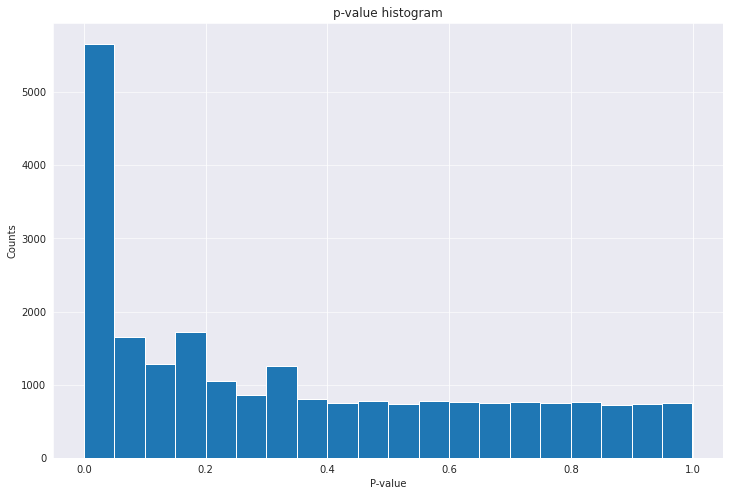

In [ ]:
plt.figure(figsize=(12,8))
plt.hist(p_val_row.values(),
         bins = 20)
plt.grid(axis='y', alpha=0.75)
plt.xlabel('P-value')
plt.ylabel('Counts')
plt.title('p-value histogram')

Of course, when having to deal with so many tests we will incur in the so called "Multiple Testing Problem" and one way to deal with it is to change the p-values into q-values using the Benjamini-Hochberg correction. These values are also known as FDRs (False Discovery Rates) and we write down a function called `q-value` that computes them.

Sometimes, however, the Benjamini-Hochberg correction is very good ad eliminating False positives, but sometimes it shriks too much the number of true positive, when adjusting the p-values. This eccesive shrinking behaviour can lead to a significant loss of important genes and we have to account for that.

This is exactly what we do in the next part:
- We try different CPM trashold (see the description of the function)
- We calculate the ajusted p-values on the genes that come out of this procedure



In [ ]:
def filter_CPM(treshold):
  '''
  This function takes as input a CPM trashold and then it looks for each gene if there are
  at least two cells with the CPM that is over the given trashold. It then stores the indices
  of the genes that did NOT pass this barrier test.
  '''
  to_filter_list = []
  for i in range(Normal.shape[0]):
    mask = [element for element in Normal.iloc[i,:] if element >= treshold]
    if len(mask) <= 2:
      to_filter_list.append(i)
  return to_filter_list

In [ ]:
def q_value (p_val_dict):
  sorted_list = [[key, value] for (key, value) in sorted(p_val_dict.items(), key=lambda x: x[1])]
  rank = 1
  for p in sorted_list:
    p[1] = p[1] * len(p_val_dict)/rank
    rank += 1
  q_val_dict = dict(sorted_list)
  q_val_dict = (sorted(q_val_dict.items()))
  return q_val_dict

In [ ]:
def graph_data_due(p_val_pre):
  y_axis = []
  for treshold in np.arange(0, 20, 1):
    aux_dictt = p_val_pre.copy()
    indices = filter_CPM(treshold)
    print("how many genes will be ignored in this iteration", len(indices))
    for ind in indices:
      del aux_dictt[ind]
    count = len([value for value in q_value(aux_dictt) if value[1] <= 0.05])
    print("Relevant number of genes for this treshold", count)
    y_axis.append(count)
    aux_dictt = p_val_pre.copy()
  return y_axis


In [ ]:
#Calculating this values will take some time, it has to go 20 iterations
y = graph_data_due(p_val_row)

KeyboardInterrupt: ignored

In [ ]:
x = np.arange(0, 20, 1)
plt.figure(figsize=(12,8))
plt.scatter(x, y,
            s = 80,
            color = "r")
plt.grid()
plt.xlabel('CPM TRESHOLD')
plt.ylabel('N. OF SIGNIFICANT GENES')
plt.title('OPTIMAL TRESHOLD SELECTION')
plt.axvline(x=4, color = "blue")
plt.show()

NameError: ignored

<Figure size 864x576 with 0 Axes>

Given that we want to preserve as many significant genes as possible when adjusting the p-values, we choose a CMP cut of 3

In [ ]:
#We calculate the optimal set of genes
indices = filter_CPM(4)
final_dictt = p_val_row.copy()

for ind in indices:
  del final_dictt[ind]

#Notice that the sensitivity setted is very very small: 0.001%
final_indices = [value[0] for value in q_value(final_dictt) if (value[1] <= 0.05)]

We apply this to the dataset we had to finally obtain the final filtered version

In [ ]:
filt_lollo_1 = Normal.copy().iloc[final_indices]
filt_lollo_1

,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B11_Normoxia_S127_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B12_Normoxia_S27_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
MTND1P23,6.772817,5.191494,5.781636,6.601558,6.750134,5.556678,6.241249,6.404638,6.165922,5.936978,...,7.046227,6.128137,5.921251,5.963004,6.251190,6.391642,6.110395,5.795721,6.291457,7.241321
MTND2P28,5.331955,3.837159,3.608782,2.310261,5.282240,3.264497,4.037888,5.255535,5.230914,3.249328,...,5.024778,4.960946,4.163534,4.068143,4.096969,5.261706,4.302640,4.783435,4.397747,5.365424
MTATP6P1,8.125904,7.524896,6.994488,7.287838,8.153417,7.229034,7.552846,8.235127,8.448522,7.194849,...,7.767775,7.605640,7.602307,7.806662,8.055522,7.871329,7.662512,7.832570,7.527590,7.869863
MTCO3P12,5.928611,5.310412,4.888170,5.155970,5.487146,4.738400,5.359810,5.903624,6.001219,4.400754,...,5.338081,4.988922,5.019487,5.558824,5.406460,5.672484,5.392190,5.290908,4.845248,5.441068
AGRN,5.923116,7.426881,3.216768,4.415141,4.843226,5.671327,0.000000,5.384952,5.567831,4.906660,...,5.868313,4.302565,3.702819,5.441522,5.003236,5.897744,5.392190,4.221829,6.466364,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-ATP6,9.169457,8.654302,7.881252,8.358717,9.272553,8.051159,8.422145,9.272768,9.459936,8.075675,...,8.740012,8.641541,8.534759,8.817472,8.760177,8.924556,8.648034,8.811779,8.535477,8.845355
MT-CO3,9.577100,8.989522,8.428350,8.797575,9.480422,8.574612,8.950374,9.673881,9.855331,8.374295,...,8.688539,8.883635,8.890753,9.283423,9.399634,9.414806,8.971273,9.265261,9.047574,9.267049
MT-TE,4.494373,0.000000,0.000000,3.340426,4.886376,2.608853,3.147706,4.511045,3.804617,3.464681,...,4.907816,4.122946,4.784858,4.068143,4.096969,4.673835,2.576354,2.821491,3.847318,4.727769
MT-CYB,9.500185,9.523174,8.219553,8.749820,8.996055,8.493594,8.313537,9.794540,9.817775,8.501586,...,8.742697,8.663470,8.763136,9.571416,9.514002,9.627635,9.388965,9.095296,9.328117,9.343454


Last, we try to implement a function that returns the name of the n most significant genes, based on the adjusted p_values calculated before

In [ ]:
def top_genes (n):
  sorted_list = [[key, value] for (key, value) in sorted(p_val_row.items(), key=lambda x: x[1])]
  rank = 1
  for p in sorted_list:
    p[1] = p[1] * len(p_val_row)/rank
    rank += 1

  indices = []
  for couple in sorted_list[:n]:
    indices.append(couple[0])

  for index in indices:
    print(Normal.index.values[index])


In [ ]:
top_genes(20)

EGLN3
SLC2A1
C4orf3
DANT1
LOXL2
PGK1
PLIN2
SLC6A8
BNIP3L
PNCK
EGLN1
BRIX1
LDHAP4
ARRDC3
SAP30-DT
NOP16
PAM
CCT6A
SEC61G
PNO1


Luckly enough at position #11 (EGLN1), #1 (EGLN3),#5 (LOXL2), #17(PAM), #2 (SLC2A1) we find two genes that we know are directly involved in the cell reaction to hypoxia (According to [DAVID Database](https://david.ncifcrf.gov/)). This little naive and baiased filtering gave us some nice results at the end and that's why we wanted to include it in the discussion

- **EGLN1**: The protein encoded by this gene catalyzes the post-translational formation of 4-hydroxyproline in hypoxia-inducible factor (HIF) alpha proteins. HIF is a transcriptional complex that plays a central role in mammalian oxygen homeostasis. This protein functions as a cellular oxygen sensor, and under normal oxygen concentration, modification by prolyl hydroxylation is a key regulatory event that targets HIF subunits for proteasomal destruction via the von Hippel-Lindau ubiquitylation complex.

- **EGLN3**: Enables peptidyl-proline 4-dioxygenase activity. Involved in several processes, including activation of cysteine-type endopeptidase activity involved in apoptotic process; peptidyl-proline hydroxylation to 4-hydroxy-L-proline; and response to hypoxia. Located in cytosol and nucleus. Implicated in renal cell carcinoma.

- **LOXL2**: This gene encodes a member of the lysyl oxidase gene family. The prototypic member of the family is essential to the biogenesis of connective tissue, encoding an extracellular copper-dependent amine oxidase that catalyses the first step in the formation of crosslinks in collagens and elastin. A highly conserved amino acid sequence at the C-terminus end appears to be sufficient for amine oxidase activity, suggesting that each family member may retain this function. The N-terminus is poorly conserved and may impart additional roles in developmental regulation, senescence, tumor suppression, cell growth control, and chemotaxis to each member of the family.

- **PAM**: 	This gene encodes a multifunctional protein. The encoded preproprotein is proteolytically processed to generate the mature enzyme. This enzyme includes two domains with distinct catalytic activities, a peptidylglycine alpha-hydroxylating monooxygenase (PHM) domain and a peptidyl-alpha-hydroxyglycine alpha-amidating lyase (PAL) domain.

- **SLC2A1**: This gene encodes a major glucose transporter in the mammalian blood-brain barrier. The encoded protein is found primarily in the cell membrane and on the cell surface, where it can also function as a receptor for human T-cell leukemia virus (HTLV) I and II.

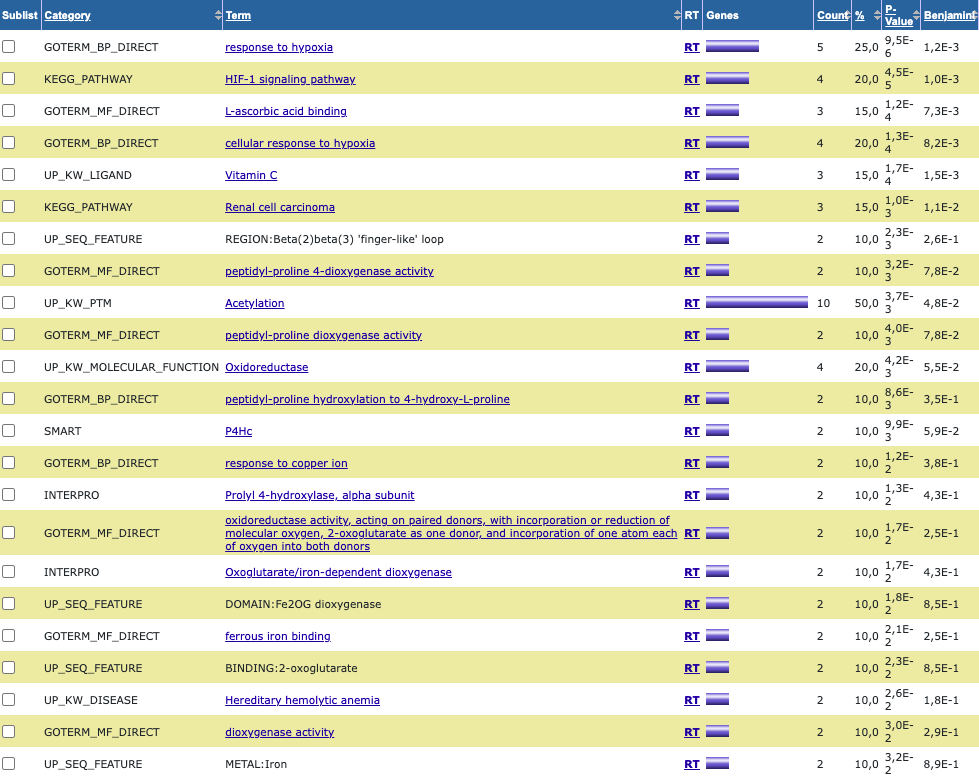

In [ ]:
proffilt = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_Filtered_Normalised_3000_Data_train.txt', delimiter = " ", index_col = 0)

In [ ]:
counter = 0
for gene in proffilt.index.values:
  if gene in filt_lollo_1.index.values:
    counter +=1

print(f"Sovrapposition between our dataframe and the provided dataframe: {counter/3000 *100}%")

Sovrapposition between our dataframe and the provided dataframe: 20.233333333333334%


Loading the meta data and the filtered and normalised dataset of HCC1806 SmartSeq.

In [ ]:
meta = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_SmartS_MetaData.tsv', delimiter = "\t", index_col = 0)
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt', delimiter = " ", index_col = 0)
print("data frame dimensions :", np.shape(df))
meta.head()

data frame dimensions : (3000, 182)


,Cell Line,PCR Plate,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,HCC1806,1,A10,Normo,24,S123,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,HCC1806,1,A12,Normo,24,S26,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,HCC1806,1,A1,Hypo,24,S97,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,HCC1806,1,A2,Hypo,24,S104,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,HCC1806,1,A3,Hypo,24,S4,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


In [ ]:
# t_meta = meta.T
# print(t_meta.shape)
# hypo_ind = (meta["Condition"] == "Hypo")
# hypo_ind = hypo_ind.to_numpy()
# norm_ind = (~(hypo_ind))
# norm_ind.sum()
# hypo_ind

### Dimensionality Reduction

> Throughout this section, we will be applying a Principal Components Analysis for the purpose of analyzing data and dimensionality reduction, as well as other dimensionality reduction techniques and discuss their outcomes.

We start by converting our Pandas DataFrame into a NumPy array.

In [ ]:
data = df.to_numpy()

Then, we extract the indices of hypoxic and normoxic cells and build two lists out of them

In [ ]:
l_hypoxia = get_condition_list(df, "Hypo")
l_normoxia = get_condition_list(df, "Norm")
print(len(l_normoxia))
l_hypoxia[:10], l_normoxia[:10]

NameError: ignored

#### PCA

As we import the PCA function from the SKLearn library, we proceed to apply it to our dataset, requesting a 95% variance expression on the reduced outcome.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components = 0.95)
data_red = pca.fit_transform(data.T)
pca.n_components_

34

We can notice that here we need 34 principal components, in order to express 95% of the variance.

In [ ]:
data_red.shape

(182, 34)

In [ ]:
pca.explained_variance_ratio_[:3]

array([0.29018923, 0.18101256, 0.12288734])

We now plot the results, starting from a 2D scatter plot on the two main principal components.

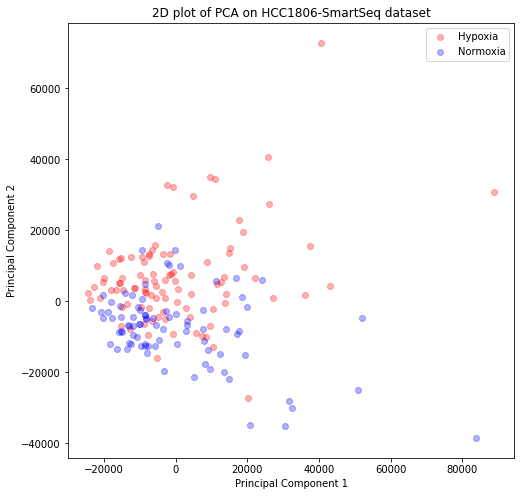

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_title('2D plot of PCA on HCC1806-SmartSeq dataset')

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], c="b",alpha = 0.3, label="Normoxia")
ax.legend()
plt.show()

Next, we can again build a scatter plot, 3D this time, as we take into account the third principal component as well.

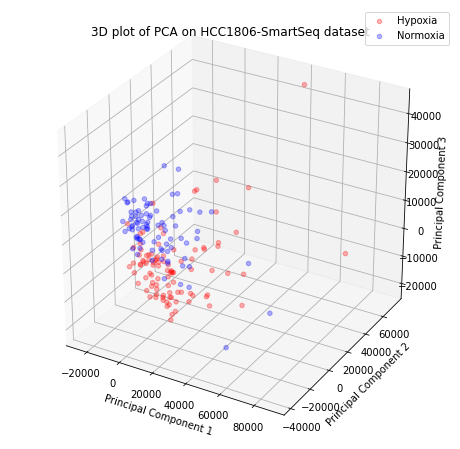

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D plot of PCA on HCC1806-SmartSeq dataset')

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], data_red[l_hypoxia,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], data_red[l_normoxia,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

##### Interactive 3D version
> Might take a few minutes to run

Notice. The following implementation is quite time-consuming when executed on large-sized datasets (since a simpler static version of the 3D plot has been implemented above, we provide the code cell below commented).

In [ ]:
plot_df = pd.DataFrame(data_red[:, 0:3])
plot_df.columns = ["PC1","PC2","PC3"]

aux_lst = []
for name in df.columns.values:
  if 'Hypo' in name:
    aux_lst.append(1)
  elif 'Norm' in name:
    aux_lst.append(0)

plot_df["Color"] = aux_lst
plot_df

,x,y,z,Color
0,-26874.672396,766.013957,-880.248212,0
1,-26354.743000,5039.849020,-5372.826809,0
2,-29351.253485,2414.726753,-3076.254097,0
3,-24813.833293,-75.979072,-3934.877133,0
4,4454.732179,-1836.273354,-1595.912696,1
...,...,...,...,...
245,-18394.340467,-5274.416642,649.525614,0
246,-10023.164045,-14507.616731,-1941.969647,0
247,603.697715,11492.308191,43230.690452,1
248,17016.931253,8398.335833,4439.884803,1


In [ ]:
# !pip install jupyter-dash

import plotly.graph_objects as go
import plotly.express as px
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output

fig = px.scatter_3d(
    data_frame = plot_df,
    x = "PC1",
    y = "PC2",
    z = "PC3",
    color = "Color",
    title = "Interactive PCA plot with supervised labels",
)

# build jupyter dash app
app = JupyterDash(__name__)
# add html components and figure to app
app.layout = html.Div([dcc.Graph(figure=fig)])
# run app inline
app.run_server(mode='inline')

<IPython.core.display.Javascript object>

#### t-SNE


We first import TSNE from the SKLearn library

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

Now, PCA is carried out on the dataframe, and all the data is mapped into a 50-dimensional space.
PCA is performed as a sort of pre-processing stage because t-SNE does not work properly on datasets having too many features (in this case the initial dataset have 3000 features), so we need to reduce the dimensionality to about 50 (a number of features with which t-SNE produces good results).

In [ ]:
pca50 = PCA(n_components=50)
data_fifty = pca50.fit_transform(data.T)
data_fifty.shape

(182, 50)

In [ ]:
pca50.explained_variance_ratio_[0:4]

array([0.29018923, 0.18101256, 0.12288734, 0.07970126])

We now apply t-SNE on the output of PCA (i.e. the data_fifty reduced dataset).

In [ ]:
embedded = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(data_fifty)

In [ ]:
embedded.shape

(182, 2)

We now plot the results.

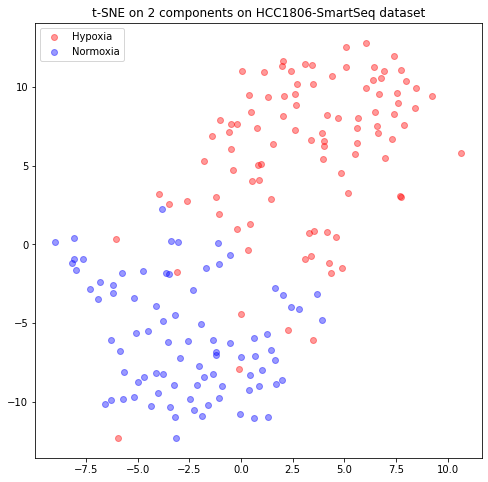

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.scatter(embedded[l_hypoxia,0], embedded[l_hypoxia,1], c="r",alpha = 0.4, label="Hypoxia")
ax.scatter(embedded[l_normoxia,0], embedded[l_normoxia,1], c="b",alpha = 0.4, label="Normoxia")
ax.set_title('t-SNE on 2 components on HCC1806-SmartSeq dataset')
ax.legend()

plt.show()

Again, we want to visualize how the t-SNE plot changes as we set ‘pca’ as init parameter. We would again expect to get a scatterplot which is very close to the one described by the PCA function.

In [ ]:
# Here the init parameter is set to 'pca'
embedded2 = TSNE(n_components=2, learning_rate='auto', init='pca').fit_transform(data_fifty)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.set_title('2 component t-SNE on HCC1806-SmartSeq dataset (pca as init)', fontsize = 15)

ax.scatter(embedded2[l_hypoxia,0], embedded2[l_hypoxia,1], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(embedded2[l_normoxia,0], embedded2[l_normoxia,1], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

KeyboardInterrupt: ignored

We can observe once more that the plot above displays a practically perfect match of the PCA plot.

#### UMAP

Let's first install the umap library

In [ ]:
# !pip install umap-learn

     |████████████████████████████████| 88 kB 3.0 MB/s 
     |████████████████████████████████| 1.1 MB 40.7 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=ce75bd95b80eaa7196e8381fc04923b2f808201bc2b92e7c2a20cc713b4ff08c
  Stored in directory: /root/.cache/pip/wheels/b3/52/a5/1fd9e3e76a7ab34f134c07469cd6f16e27ef3a37aeff1fe821
  Created wheel for pynndescent: filename=pynndescent-0.5.7-py3-none-any.whl size=54286 sha256=f7e687ffcf649d46a44e5827938b3ddca0a60de035d4c051298bef1995aec004
  Stored in directory: /root/.cache/pip/wheels/7f/2a/f8/7bd5dcec71bd5c669f6f574db3113513696b98f3f9b51f496c
Successfully built umap-learn pynndescent


In [ ]:
from umap import UMAP

In [ ]:
reducer = UMAP()

embedding_data = reducer.fit_transform(data.T)
embedding_data.shape

(182, 2)

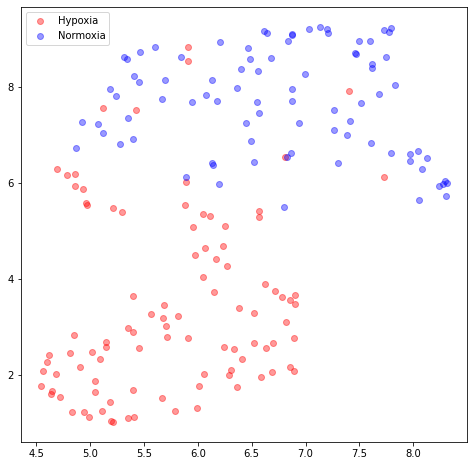

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.scatter(embedding_data[l_hypoxia, 1], embedding_data[l_hypoxia,0], c="r",alpha = 0.4, label="Hypoxia")
ax.scatter(embedding_data[l_normoxia, 1], embedding_data[l_normoxia,0], c="b",alpha = 0.4, label="Normoxia")
ax.legend()
plt.show()

### Clustering methods

Again, since we are dealing with a rather small-sized dataframe, clustering techniques will be implemented on the entire dataset.

#### K-means

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
kmeans = KMeans(n_clusters=2, random_state=42)
pred_clus = kmeans.fit_predict(data.T)

In [ ]:
hypo = (pred_clus == 1)
norm = (pred_clus == 0)

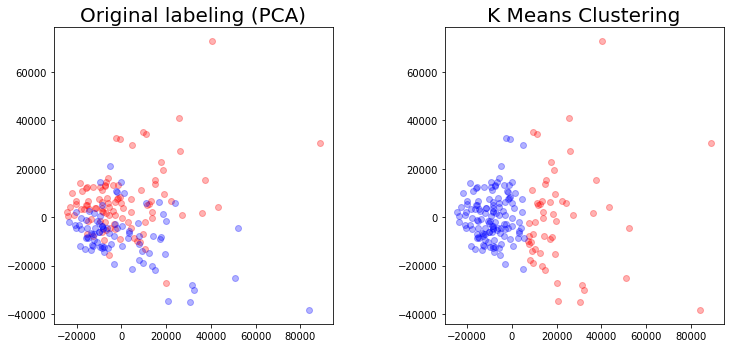

In [ ]:
fig = plt.figure(figsize = (12,12))
ax = fig.add_subplot(2,2,1)
ax1 = fig.add_subplot(2,2,2)
ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(data_red[hypo,0],data_red[hypo,1], c="r",alpha = 0.3)
ax1.scatter(data_red[norm,0],data_red[norm,1], c="b",alpha = 0.3)

plt.subplots_adjust(wspace=0.4)

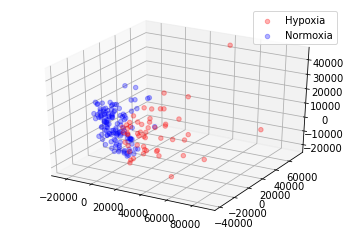

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(data_red[hypo,0],data_red[hypo,1], data_red[hypo,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[norm,0],data_red[norm,1], data_red[norm,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

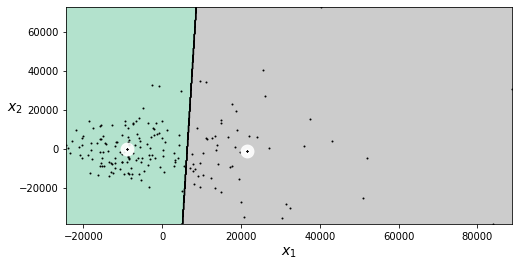

In [ ]:
kmeans.fit_predict(data_red[:, 0:2])

plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans, data_red[:, 0:2])
plt.show()

#### Gaussian mixture

In [ ]:
from sklearn.mixture import GaussianMixture

gm = GaussianMixture(n_components=2, random_state=42,
                     covariance_type = "diag")

In [ ]:
pred_mix = gm.fit_predict(data.T)

In [ ]:
hypo_mix = (pred_mix == 1)
norm_mix = (pred_mix == 0)

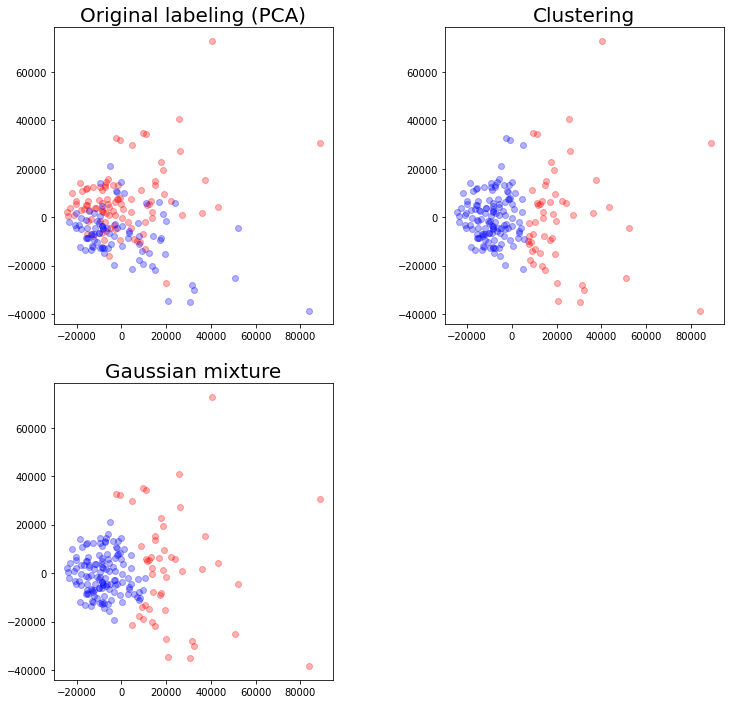

In [ ]:
fig = plt.figure(figsize = (12,12))
ax = fig.add_subplot(2,2,1)
ax1 = fig.add_subplot(2,2,2)
ax2 = fig.add_subplot(2,2,3)
ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax2.set_title('Gaussian mixture', fontsize = 20)

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(data_red[hypo,0],data_red[hypo,1], c="r",alpha = 0.3)
ax1.scatter(data_red[norm,0],data_red[norm,1], c="b",alpha = 0.3)

ax2.scatter(data_red[hypo_mix,0],data_red[hypo_mix,1], c="r",alpha = 0.3)
ax2.scatter(data_red[norm_mix,0],data_red[norm_mix,1], c="b",alpha = 0.3)


plt.subplots_adjust(wspace=0.4)

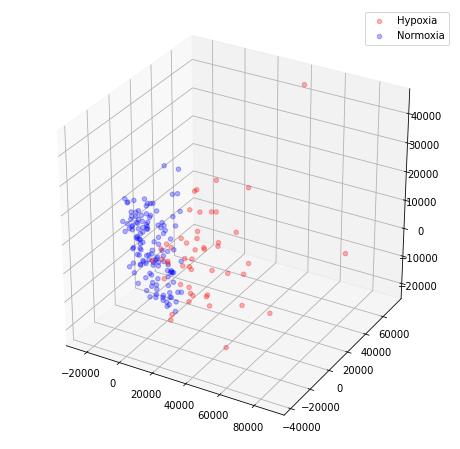

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(data_red[hypo_mix,0],data_red[hypo_mix,1], data_red[hypo_mix,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[norm_mix,0],data_red[norm_mix,1], data_red[norm_mix,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

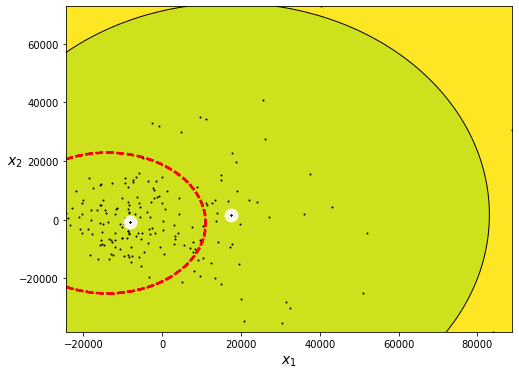

In [ ]:
gm.fit_predict(data_red[:, 0:2])

plt.figure(figsize=(8, 6))
plot_gaussian_mixture(gm, data_red[:, 0:2])
plt.show()

#### Bayesian Gaussian Mixture


Here we try to implement a different yet similar method to Gaussian Mixture.

The Bayesian Gaussian Mixture is a method which allows you to not know the exact number of clusters in your data, in a sense it is better because by using a prior it understands how many clusters there should be.

In [ ]:
from sklearn.mixture import BayesianGaussianMixture

In [ ]:
bgm = BayesianGaussianMixture(n_components = 2, random_state = 42)
pred_bgm = bgm.fit_predict(data.T)

In [ ]:
hypo_bgm = (pred_bgm == 1)
norm_bgm = (pred_bgm == 0)

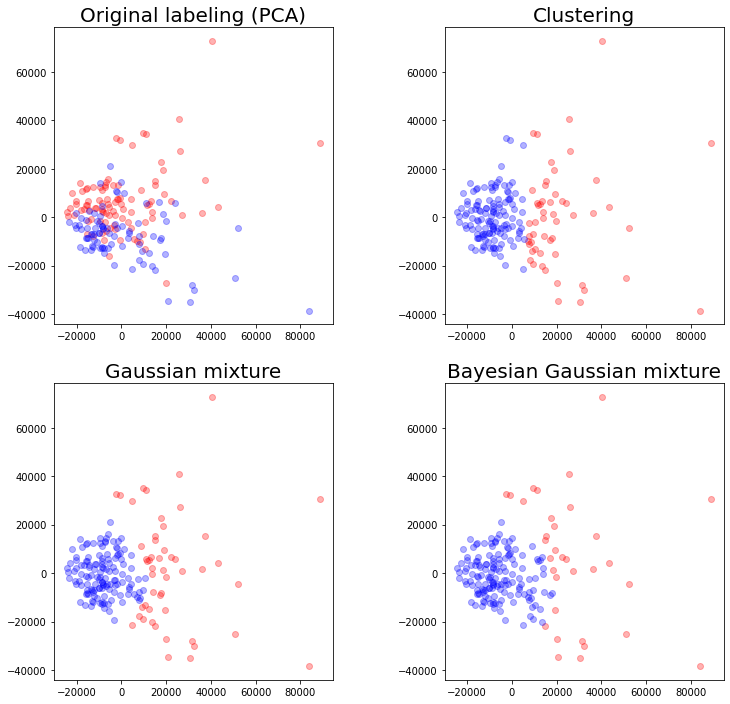

In [ ]:
fig = plt.figure(figsize = (12,12))
ax = fig.add_subplot(2,2,1)
ax1 = fig.add_subplot(2,2,2)
ax2 = fig.add_subplot(2,2,3)
ax3 = fig.add_subplot(2,2,4)

ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax2.set_title('Gaussian mixture', fontsize = 20)

ax3.set_title('Bayesian Gaussian mixture', fontsize = 20)

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(data_red[hypo,0],data_red[hypo,1], c="r",alpha = 0.3)
ax1.scatter(data_red[norm,0],data_red[norm,1], c="b",alpha = 0.3)

ax2.scatter(data_red[hypo_mix,0],data_red[hypo_mix,1], c="r",alpha = 0.3)
ax2.scatter(data_red[norm_mix,0],data_red[norm_mix,1], c="b",alpha = 0.3)

ax3.scatter(data_red[hypo_bgm,0],data_red[hypo_bgm,1], c="r",alpha = 0.3)
ax3.scatter(data_red[norm_bgm,0],data_red[norm_bgm,1], c="b",alpha = 0.3)

plt.subplots_adjust(wspace=0.4)

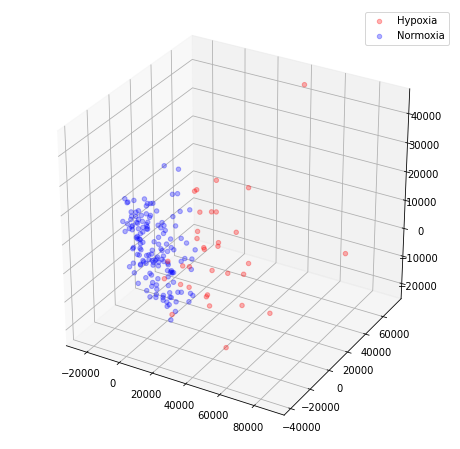

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(data_red[hypo_bgm,0],data_red[hypo_bgm,1], data_red[hypo_bgm,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[norm_bgm,0],data_red[norm_bgm,1], data_red[norm_bgm,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

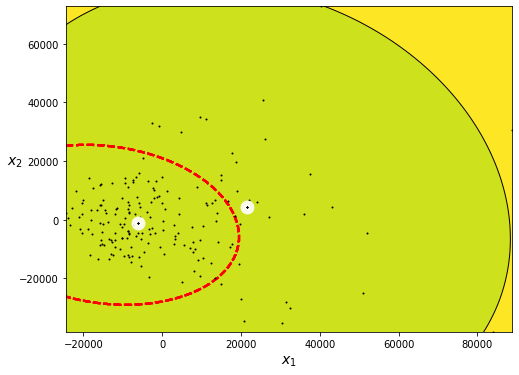

In [ ]:
bgm.fit_predict(data_red[:, 0:2])

plt.figure(figsize=(8, 6))
plot_gaussian_mixture(bgm, data_red[:, 0:2])
plt.show()

#### Agglomerative Clustering

We are also interested on the behavior and performance of hierarchical clustering methods.
In agglomerative algorithms, each item starts in its own cluster, then, objects are recursively clustered by similarity, i.e. the distances between groups, two items at a time. Eventually, all items will be grouped in one cluster.
We choose to implement Agglomerative Clustering, as it is the most commonly used technique of this kind.

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
aggl = AgglomerativeClustering(n_clusters=2)

In [ ]:
pred_aggl = aggl.fit_predict(data_red)

In [ ]:
hypo_aggl = (pred_aggl == 1)
norm_aggl = (pred_aggl == 0)

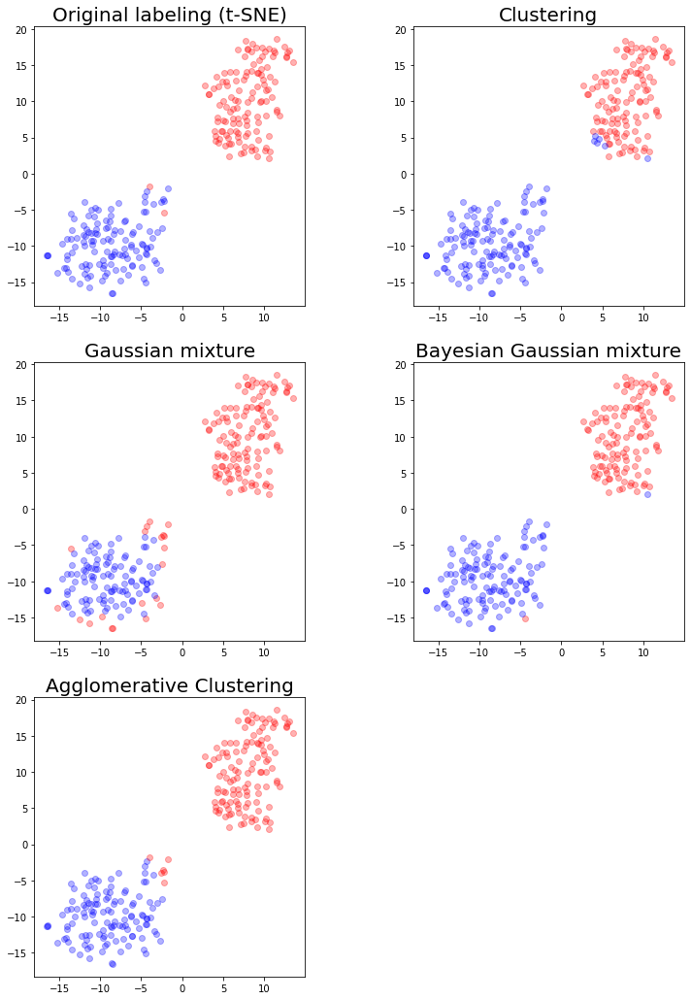

In [ ]:
fig = plt.figure(figsize = (12,18))
ax = fig.add_subplot(3,2,1)
ax1 = fig.add_subplot(3,2,2)
ax2 = fig.add_subplot(3,2,3)
ax3 = fig.add_subplot(3,2,4)
ax4 = fig.add_subplot(3,2,5)

ax.set_title('Original labeling (t-SNE)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax2.set_title('Gaussian mixture', fontsize = 20)

ax3.set_title('Bayesian Gaussian mixture', fontsize = 20)

ax4.set_title('Agglomerative Clustering', fontsize = 20)

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(data_red[hypo,0],data_red[hypo,1], c="r",alpha = 0.3)
ax1.scatter(data_red[norm,0],data_red[norm,1], c="b",alpha = 0.3)

ax2.scatter(data_red[hypo_mix,0],data_red[hypo_mix,1], c="r",alpha = 0.3)
ax2.scatter(data_red[norm_mix,0],data_red[norm_mix,1], c="b",alpha = 0.3)

ax3.scatter(data_red[hypo_bgm,0],data_red[hypo_bgm,1], c="r",alpha = 0.3)
ax3.scatter(data_red[norm_bgm,0],data_red[norm_bgm,1], c="b",alpha = 0.3)

ax4.scatter(data_red[hypo_aggl,0],data_red[hypo_aggl,1], c="b",alpha = 0.3)
ax4.scatter(data_red[norm_aggl,0],data_red[norm_aggl,1], c="r",alpha = 0.3)

plt.subplots_adjust(wspace=0.4)

This clustering method can be easily visualized in 2D plots known as dendograms, in which the clusters at each step of the algorithm can be clearly displayed. With the following cell, we will try to implement dendograms for each linkage method available for AgglomerativeClustering.

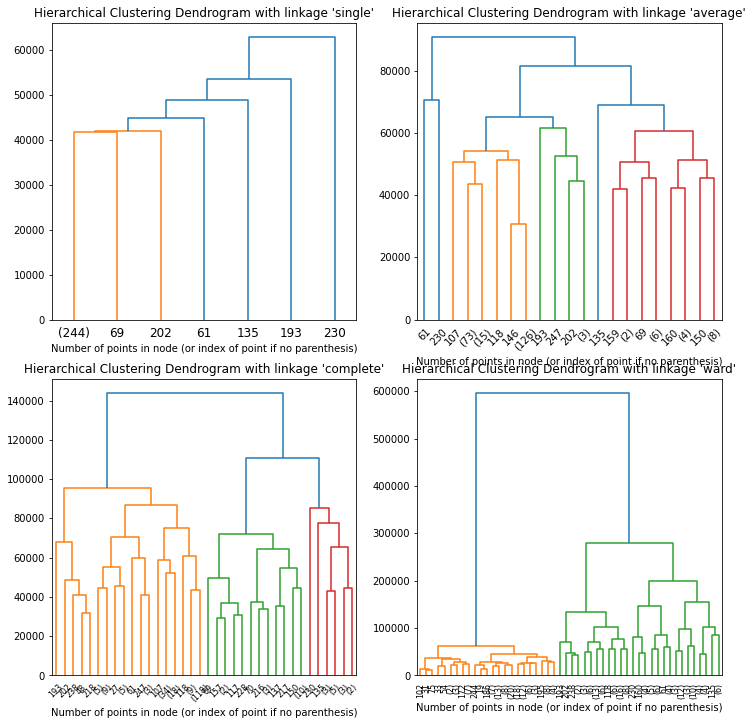

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
l_linkage = ['single', 'average', 'complete', 'ward']

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12,12))

for n, linkage in enumerate(l_linkage):
    model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage=linkage)
    model = model.fit(data.T)

    ax = plt.subplot(2, 2, n + 1)
    # plot the top five levels of the dendrogram
    plot_dendrogram(model, truncate_mode="level", p=5)
    ax.set_title("Hierarchical Clustering Dendrogram with linkage " + "'" + linkage + "'")
    ax.set_xlabel("Number of points in node (or index of point if no parenthesis)")

plt.show()

#### Evaluating Clustering methods

We will now look at how the various clusterings perform in understanding whether a cell is an Hypoxia one or not.

We will do it over the normal data, i.e. 'df' transposed, that is data.T

In [ ]:
y = []
for i in range(len(l_hypoxia) + len(l_normoxia)):
  if i in l_hypoxia:
    y.append(1)
  elif i in l_normoxia:
    y.append(0)

##### K Means Clustering

In [ ]:
y_pred_clus = kmeans.fit_predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_clus==y))
print("fraction of correct predictions", np.sum(y_pred_clus==y) / len(y_pred_clus))

correct predictions:  9826
fraction of correct predictions 0.45436049200036993


##### Gaussian Mixture

In [ ]:
gm.fit(data.T)
y_pred_mix = gm.predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_mix==y))
print("fraction of correct predictions", np.sum(y_pred_mix==y) / len(y_pred_mix))

correct predictions:  241
fraction of correct predictions 0.964


##### Bayesian Gaussian Mixture

In [ ]:
bgm.fit(data.T)
y_pred_bgm = bgm.predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_bgm==y))
print("fraction of correct predictions", np.sum(y_pred_bgm==y) / len(y_pred_bgm))

correct predictions:  244
fraction of correct predictions 0.976


By observing these results, we can conclude that all clustering methods implemented above, be them Kmeans, GM, or BGM, perform with a significant degree of accuracy on this dataset.

###Classifiers

#### Opening Files

In [ ]:
meta = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_SmartS_MetaData.tsv', delimiter = "\t", index_col = 0)
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt', delimiter = " ", index_col = 0)
print("data frame dimensions :", np.shape(df))
meta.head()

data frame dimensions : (3000, 182)


,Cell Line,PCR Plate,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,HCC1806,1,A10,Normo,24,S123,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,HCC1806,1,A12,Normo,24,S26,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,HCC1806,1,A1,Hypo,24,S97,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,HCC1806,1,A2,Hypo,24,S104,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,HCC1806,1,A3,Hypo,24,S4,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


The models for classification of Hypoxic and Normoxic are the same ones implemented in the SmartSeq MCF7 section and are carried out following the same pipeline. For the main description, see Section SmartSeq - Classifiers.

In [ ]:
from sklearn.model_selection import train_test_split

HCC_smart_T = df.T
X = HCC_smart_T.to_numpy()

condition = []
for i in list(HCC_smart_T.index):
  if "Norm" in i:
    condition.append(0)
  if "Hypo" in i:
    condition.append(1)
HCC_smart_T["Condition"] = condition

y = np.array(condition)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 42)

In [ ]:
(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

((136, 3000), (46, 3000), (136,), (46,))

####Random Forest

In [ ]:
from sklearn.model_selection import GridSearchCV
from  sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(criterion = "gini", random_state=42)

p_grid = {'n_estimators': [15, 30, 80, 150, 250],
          'criterion': ["gini", "entropy"],
          'min_samples_leaf': [1, 2]}

gs = GridSearchCV(rfc, param_grid = p_grid).fit(X_train, y_train)
gs.best_params_

{'criterion': 'gini', 'min_samples_leaf': 1, 'n_estimators': 15}

In [ ]:
from sklearn.metrics import accuracy_score

rfc = RandomForestClassifier(n_estimators = gs.best_params_["n_estimators"],
                             min_samples_leaf = gs.best_params_["min_samples_leaf"],
                             criterion = gs.best_params_["criterion"],
                             random_state = 42)

rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)
accuracy_score(y_pred, y_test)

0.9782608695652174

##### Feature Importance

In [ ]:
imp = rfc.feature_importances_
q = np.quantile(imp, 0.98)
gene = []
for name, score in zip(list(HCC_smart_T.iloc[:,:-1].columns), rfc.feature_importances_):
  if score >= q:
    #print(name, score)
    gene.append((name,score))
gene.sort(key = lambda x : x[1],reverse=True)
gene
genes = [i[0] for i in gene]
for i in genes:
    print(i,end=" ")
genesH = genes

LOXL2 SLC2A1 ERO1A BNIP3 TPBG NDRG1 FAM162A BNIP3L KCTD11 INSIG1 LDHA BLCAP AHNAK2 KRT19 P4HA1 MT1X GRHL3 KYNU JUNB HSPH1 SRM PLK1 RIPK4 H1-0 PRDM1 EGLN1 PLOD2 H2BC8 GJB4 HDAC5 ARRDC3 CRIP2 ACTG1P25 BHLHE40 TUBA1B KCNMA1 PGK1 UGDH MXD1 LIPA TSPAN33 VSIR STRA6 TXNIP ARL6IP1 KCNS3 SLC43A2 GLUL LDHB PTGS2 F10 TP53INP1 SLC2A3 ASB2 RPH3AL KCTD8 EIF5 FNDC4 GEM TSPEAR-AS1 

We now want to find a list of the genes that most significantly differ between Normoxic and Hypoxic cells, according to the Random Forest model.

<BarContainer object of 27 artists>

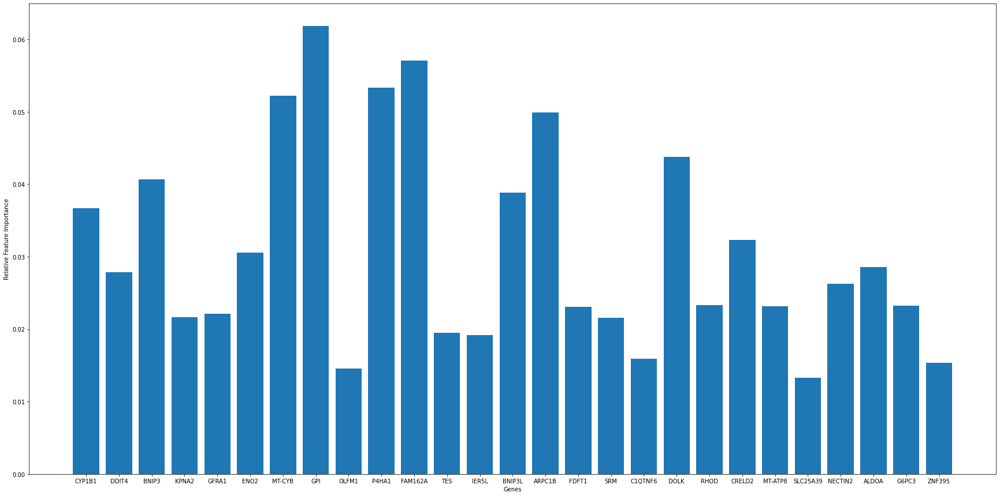

In [ ]:
plt.figure(figsize = (30,15))

g = []
s = []
for name, score in zip(list(HCC_smart_T.iloc[:,:-1].columns), rfc.feature_importances_):
  if score >= 0.013:
    g.append(name)
    s.append(score)


plt.xlabel('Genes')
plt.ylabel("Relative Feature Importance")

plt.bar(g, s)

##### Analysing relationship between Principal Components and accuracy

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt", sep = " ")

In [ ]:
df_meta = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_SmartS_MetaData.tsv", delimiter = "\t", header=0)

df_meta["Condition"] = df_meta.Condition.eq('Hypo').mul(1)

col_l= []
for j in list(df_train.columns):
    for i , h in zip(df_meta["Filename"], df_meta["Condition"]):
        if j == i:
            col_l.append(h)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from  sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score

acc_list = []
dim_list = [i for i in range(1, 20)]
for i in range(1, 20):

  #PCA
  X = df_train.to_numpy()
  X_t = np.transpose(X)
  pca = PCA(n_components = i)
  Xred = pca.fit_transform(X_t)
  df_red = pd.DataFrame(Xred)

  #Creating the classification framework
  df_red["Classification"] = col_l

  X = df_red.iloc[:,:-1]
  y = df_red["Classification"]

  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state = 42)

  #Fitting the random forest
  rfc = RandomForestClassifier(n_estimators = 100,
                               min_samples_leaf = 1,
                               min_samples_split = 2,
                               criterion="gini", random_state = 42)

  rfc.fit(X_train, y_train)
  y_pred = rfc.predict(X_test)
  acc_list.append(accuracy_score(y_pred, y_test))


<BarContainer object of 19 artists>

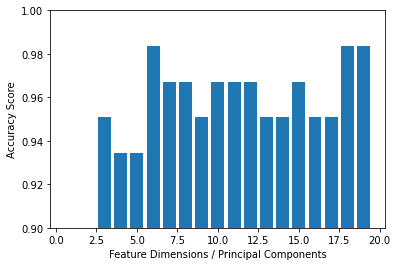

In [ ]:
#plotting the accuracy scores
(figsize = (30,15))

plt.xlabel("Feature Dimensions / Principal Components")
plt.ylabel("Accuracy Score")
plt.ylim([0.90, 1])

plt.bar(dim_list, acc_list)

####Gradient Boosting

In [ ]:
(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

((136, 3000), (46, 3000), (136,), (46,))

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

gb_clf = GradientBoostingClassifier(random_state = 42)

p_grid = {'max_features' : [6, 10, 25, 40],
          'max_leaf_nodes' : [4, 8, 16, 32],
          'n_estimators' : [20, 30, 40, 60, 100, 150]}

gs = GridSearchCV(gb_clf, param_grid = p_grid).fit(X_train, y_train)
gs.best_params_

{'max_features': 6, 'max_leaf_nodes': 8, 'n_estimators': 150}

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score

gb_clf = GradientBoostingClassifier(learning_rate = 0.1,
                                    max_features = gs.best_params_['max_features'],
                                    max_leaf_nodes = gs.best_params_['max_leaf_nodes'],
                                    n_estimators = gs.best_params_['n_estimators'])

gb_clf.fit(X_train, y_train)
y_pred = gb_clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.9782608695652174

####SVM

In [ ]:
(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

((187, 3000), (63, 3000), (187,), (63,))

In [ ]:
from sklearn.svm import SVC

svc = SVC()
parameters = {'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
              'C': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8, 1, 1.5, 2, 4, 6, 10],
              'gamma': ['scale', 'auto'],
              'degree': [1, 2, 3, 4]}

clf = GridSearchCV(svc, parameters).fit(X_train, y_train)
clf.best_params_

{'C': 0.1, 'degree': 1, 'gamma': 'scale', 'kernel': 'rbf'}

In [ ]:
svc = SVC(C=clf.best_params_["C"],
          kernel=clf.best_params_["kernel"],
          gamma=clf.best_params_["gamma"],
          degree=clf.best_params_["degree"])

svc.fit(X_train, y_train)
y_pred = svc.predict(X_test)
accuracy_score(y_pred, y_test)

0.9841269841269841

#### Neural Network

Let's now try to train and predict hypoxia and normoxia on the other data set

In [ ]:
df_meta = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_SmartS_MetaData.tsv", delimiter = "\t", header=0)

df_meta["Condition"] = df_meta.Condition.eq('Hypo').mul(1)
col_= []
for j in list(df_train.columns):
    for i , h in zip(df_meta["Filename"], df_meta["Condition"]):
        if j == i:
            col_.append(h)



In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt", sep = " ")
df_train_t = df_train.T
df_train_t["Classification"] = col_

In [ ]:
from sklearn.model_selection import train_test_split

X = df_train_t.iloc[:,:-1]
y = df_train_t["Classification"]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33)

In [ ]:
x_valid, x_train = X_train[:18], X_train[18:]
y_valid, y_train = y_train[:18], y_train[18:]

doing the same thing as before

In [ ]:
model = Sequential()
model.add(Dense(units=300, activation= "relu", input_shape= (3000,)))
model.add(Dense(units= 100, activation= "relu"))
model.add(Dense(units= 1,activation = 'sigmoid'))


In [ ]:
model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer=keras.optimizers.Adam(learning_rate=0.0001, decay = 0.001),
              metrics=['accuracy'])

In [ ]:
hist=model.fit(x = x_train, y = y_train, epochs=20, validation_data = (x_valid,y_valid))

Epoch 1/20


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


3/4 [=====================>........] - ETA: 0s - loss: 445.4955 - accuracy: 0.4896

/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


4/4 [==============================] - 3s 396ms/step - loss: 419.0799 - accuracy: 0.5146 - val_loss: 95.2831 - val_accuracy: 0.7222
Epoch 2/20
4/4 [==============================] - 0s 62ms/step - loss: 154.4945 - accuracy: 0.6117 - val_loss: 84.2173 - val_accuracy: 0.7222
Epoch 3/20
4/4 [==============================] - 0s 57ms/step - loss: 70.9539 - accuracy: 0.7961 - val_loss: 8.3093 - val_accuracy: 0.9444
Epoch 4/20
4/4 [==============================] - 0s 63ms/step - loss: 26.0875 - accuracy: 0.8835 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 5/20
4/4 [==============================] - 0s 38ms/step - loss: 16.5616 - accuracy: 0.9417 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 6/20
4/4 [==============================] - 0s 37ms/step - loss: 7.3736 - accuracy: 0.9709 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 7/20
4/4 [==============================] - 0s 55ms/step - loss: 1.0967 - accuracy: 0.9806 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 8/20
4

In [ ]:
model.evaluate(X_test, y_test)

2/2 [==============================] - 0s 14ms/step - loss: 10.5361 - accuracy: 0.9672


[10.536117553710938, 0.9672130942344666]